In [1]:
import requests
import pandas as pd
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
api_url = "https://whisker-interview.vercel.app/data/get_data?mac=4B-96-AB-51-7F-C4&date=20221212"

In [2]:
res = requests.get(api_url)

In [3]:
res_data = res.json()

In [4]:
df = pd.DataFrame(res_data)

In [5]:
df

,ix,voltage4hzCal,averagePeaksMax
0,2022-12-12T00:00:00.445610,119.788214,12
1,2022-12-12T00:00:00.695663,119.832417,10
2,2022-12-12T00:00:00.945734,119.812130,10
3,2022-12-12T00:00:01.195803,120.074819,11
4,2022-12-12T00:00:01.445879,119.809558,9
...,...,...,...
60733,2022-12-12T04:59:59.186845,121.049516,7
60734,2022-12-12T04:59:59.436746,121.014628,8
60735,2022-12-12T04:59:59.686636,120.982351,7
60736,2022-12-12T04:59:59.936536,120.961345,7


In [6]:
df['ix'] = pd.to_datetime(df['ix'])
df

,ix,voltage4hzCal,averagePeaksMax
0,2022-12-12 00:00:00.445610,119.788214,12
1,2022-12-12 00:00:00.695663,119.832417,10
2,2022-12-12 00:00:00.945734,119.812130,10
3,2022-12-12 00:00:01.195803,120.074819,11
4,2022-12-12 00:00:01.445879,119.809558,9
...,...,...,...
60733,2022-12-12 04:59:59.186845,121.049516,7
60734,2022-12-12 04:59:59.436746,121.014628,8
60735,2022-12-12 04:59:59.686636,120.982351,7
60736,2022-12-12 04:59:59.936536,120.961345,7


In [7]:
df['ix'].min()

Timestamp('2022-12-12 00:00:00.445610')

In [8]:
df['ix'].max()

Timestamp('2022-12-12 05:00:00.186441')

<Axes: xlabel='ix'>

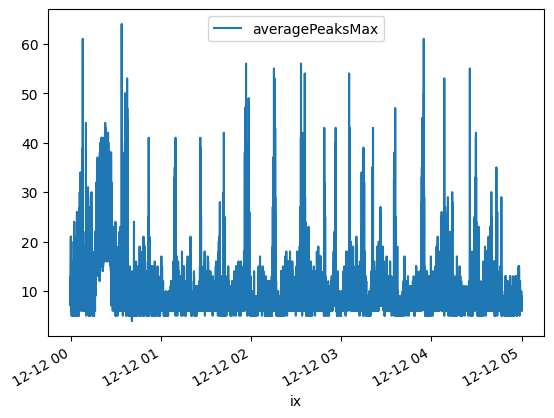

In [9]:
df.plot(x='ix', y='averagePeaksMax')

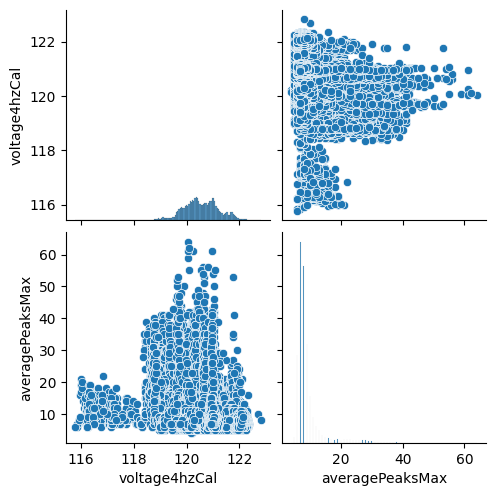

In [10]:
sns.pairplot(data=df)

In [11]:
df.shape

(60738, 3)

In [12]:
df_ix = df.set_index('ix')

In [13]:
resampled_df = df_ix.resample('1min').max()
temp_df = df_ix.resample('1min').min()
resampled_df[['MIN-voltage4hzCal', 'MIN-avgPeaksMax']] = temp_df
resampled_df

,voltage4hzCal,averagePeaksMax,MIN-voltage4hzCal,MIN-avgPeaksMax
ix,,,,
2022-12-12 00:00:00,120.119902,21,118.860933,5
2022-12-12 00:01:00,120.251713,16,118.892635,5
2022-12-12 00:02:00,120.355074,24,119.048713,5
2022-12-12 00:03:00,120.422299,14,119.182176,5
2022-12-12 00:04:00,120.558470,26,119.109747,5
...,...,...,...,...
2022-12-12 04:56:00,121.591014,13,120.746773,5
2022-12-12 04:57:00,121.147772,15,120.782642,5
2022-12-12 04:58:00,121.225588,15,120.878527,5


<Axes: xlabel='ix', ylabel='voltage4hzCal'>

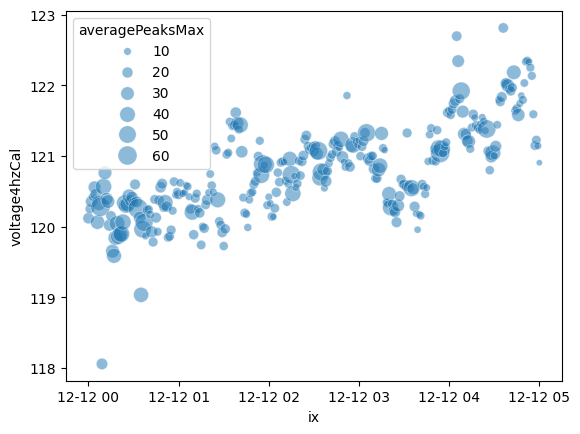

In [14]:
sns.scatterplot(data=resampled_df, x='ix', y='voltage4hzCal', sizes=(20, 200), alpha=.5, size='averagePeaksMax')

In [15]:
import plotly.graph_objects as go

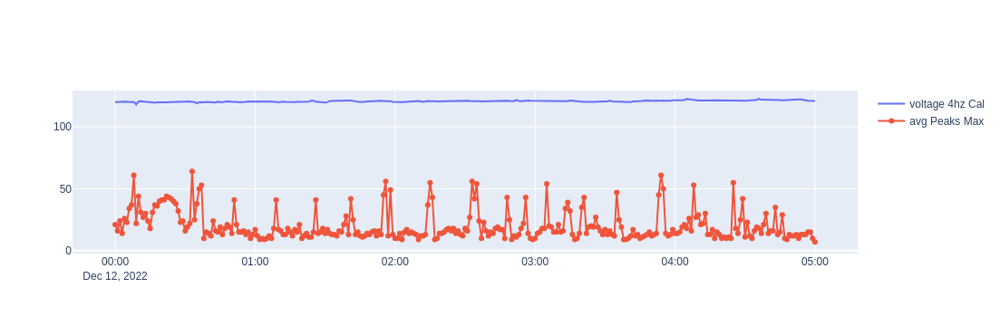

In [16]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=resampled_df.index, y=resampled_df['voltage4hzCal'], mode='lines', name='voltage 4hz Cal'))
fig.add_trace(go.Scatter(x=resampled_df.index, y=resampled_df['averagePeaksMax'], mode='lines+markers', name='avg Peaks Max'))


In [17]:
from plotly.subplots import make_subplots

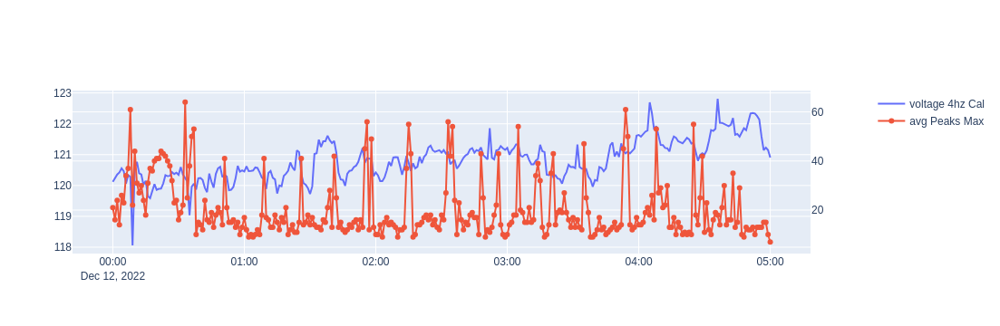

In [18]:
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=resampled_df.index, 
                         y=resampled_df['voltage4hzCal'], 
                         mode='lines', 
                         name='voltage 4hz Cal',
                        ),
             secondary_y=False)
fig.add_trace(go.Scatter(x=resampled_df.index, 
                         y=resampled_df['averagePeaksMax'], 
                         mode='lines+markers', 
                         name='avg Peaks Max'
                        ),
             secondary_y=True
                        )

In [19]:
df_ix

,voltage4hzCal,averagePeaksMax
ix,,
2022-12-12 00:00:00.445610,119.788214,12
2022-12-12 00:00:00.695663,119.832417,10
2022-12-12 00:00:00.945734,119.812130,10
2022-12-12 00:00:01.195803,120.074819,11
2022-12-12 00:00:01.445879,119.809558,9
...,...,...
2022-12-12 04:59:59.186845,121.049516,7
2022-12-12 04:59:59.436746,121.014628,8
2022-12-12 04:59:59.686636,120.982351,7


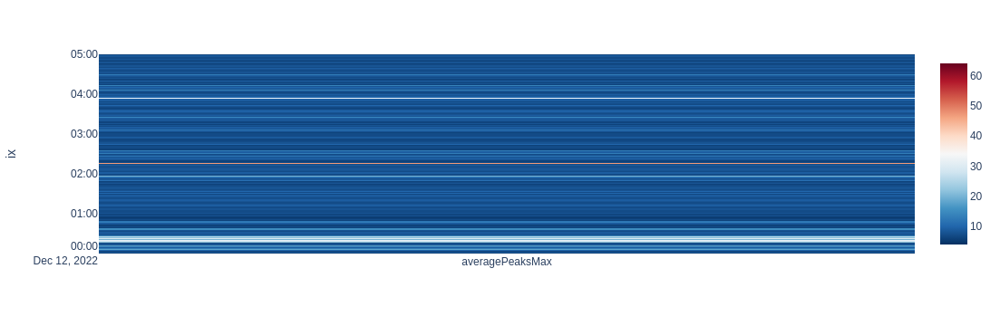

In [28]:
import plotly.express as px
fig = px.imshow(df_ix[['averagePeaksMax']], color_continuous_scale='RdBu_r', origin='lower')
fig.show()

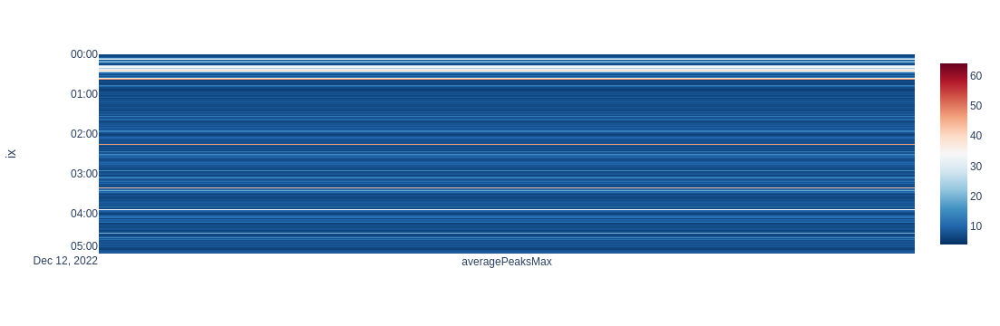

In [34]:
fig = px.imshow(df_ix[['averagePeaksMax']], color_continuous_scale='RdBu_r', origin='upper')
fig.show()

In [42]:
api_url2 = "https://whisker-interview.vercel.app/data/get_data?mac=4B-96-AB-51-7F-C4&date=20221212&compressed=true"
res2 = requests.get(api_url2)
data2 = res2.json()

In [45]:
df_c = pd.DataFrame(data2)

In [46]:
df_c

,timedeltas,voltage4hzCal,averagePeaksMax
0,445,119.79,12
1,250,119.83,10
2,250,119.81,10
3,250,120.07,11
4,250,119.81,9
...,...,...,...
60733,249,121.05,7
60734,249,121.01,8
60735,249,120.98,7
60736,249,120.96,7


In [47]:
print(df_c['timedeltas'].min())
print(df_c['timedeltas'].max())

247
15251


In [48]:
df

,ix,voltage4hzCal,averagePeaksMax
0,2022-12-12 00:00:00.445610,119.788214,12
1,2022-12-12 00:00:00.695663,119.832417,10
2,2022-12-12 00:00:00.945734,119.812130,10
3,2022-12-12 00:00:01.195803,120.074819,11
4,2022-12-12 00:00:01.445879,119.809558,9
...,...,...,...
60733,2022-12-12 04:59:59.186845,121.049516,7
60734,2022-12-12 04:59:59.436746,121.014628,8
60735,2022-12-12 04:59:59.686636,120.982351,7
60736,2022-12-12 04:59:59.936536,120.961345,7


<Axes: xlabel='timedeltas'>

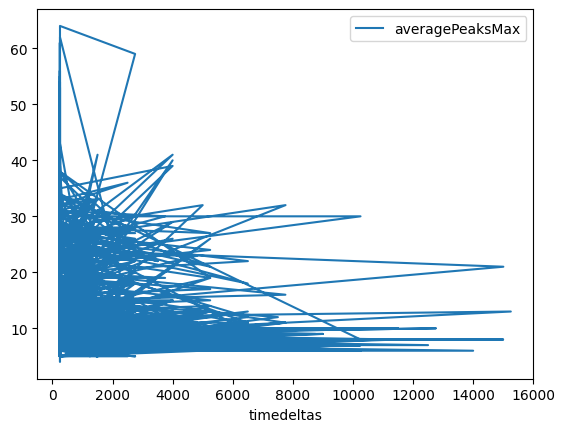

In [49]:
df_c.plot(x='timedeltas', y='averagePeaksMax')

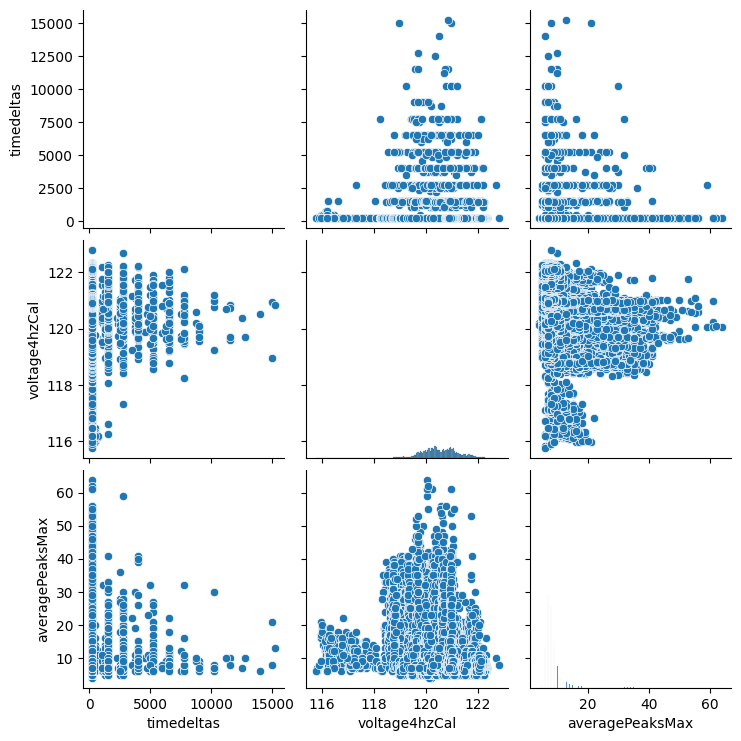

In [50]:
sns.pairplot(df_c)

In [56]:
df_c.drop('td_gen', axis=1, inplace=True)

In [62]:
df_c.iloc[2]['timedeltas'] + 250

np.float64(500.0)

In [63]:
prev = 0
td_series = []
for i in range(df_c['timedeltas'].shape[0]):
    curr = df_c.iloc[i]['timedeltas'] + prev
    prev = curr
    td_series.append(curr)

In [65]:
df_c['td_gen'] = td_series

In [66]:
df_c

,timedeltas,voltage4hzCal,averagePeaksMax,td_gen
0,445,119.79,12,445.0
1,250,119.83,10,695.0
2,250,119.81,10,945.0
3,250,120.07,11,1195.0
4,250,119.81,9,1445.0
...,...,...,...,...
60733,249,121.05,7,17962881.0
60734,249,121.01,8,17963130.0
60735,249,120.98,7,17963379.0
60736,249,120.96,7,17963628.0


<Axes: xlabel='td_gen'>

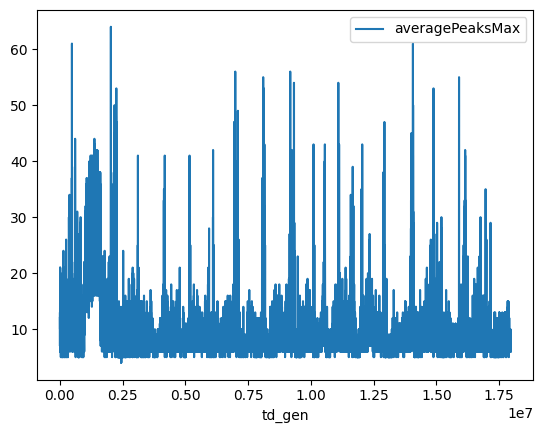

In [67]:
df_c.plot(x='td_gen', y='averagePeaksMax')